# Lab 2: Homography estimation and applications

In this lab you will learn how to estimate a homography relating two images given a set of correspondences between them. Then, you will work with different computer vision applications of the homography.

More precisely, the goals are:

1) Homography estimation with the DLT algorithm. <br>

2) Application: Image mosaics. <br>

3) Refinement of the estimated homography with the Gold Standard algorithm. <br>

4) Application: Camera calibration with a planar pattern and augmented reality. <br>

5) Application: Logo detection. <br>

6) Application: Logo replacement.

The following file combines some text cells (Markdown cells) and code cells. Some parts of the code need to be completed. All tasks you need to complete are marked in <span style='color:Green'> green.  </span>

In [2]:
!pip install opencv-contrib-python==3.4.2.17

     |████████████████████████████████| 30.6 MB 5.1 MB/s 
You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.


In [2]:
import numpy as np
import cv2
import math
import sys
import matplotlib
from matplotlib import pyplot as plt
from operator import itemgetter
from utils import apply_H_fixed_image_size, plot_img, Ransac_DLT_homography

## **1. Homography estimation with the DLT algorithm**

### **1.1 Compute image correspondences**
Execute the following code to find image correspondences using ORB [1] (you may also use SIFT, SURF, etc)

[1] Ethan Rublee, Vincent Rabaud, Kurt Konolige, Gary R. Bradski: ORB: An efficient alternative to SIFT or SURF. ICCV 2011: 2564-2571.

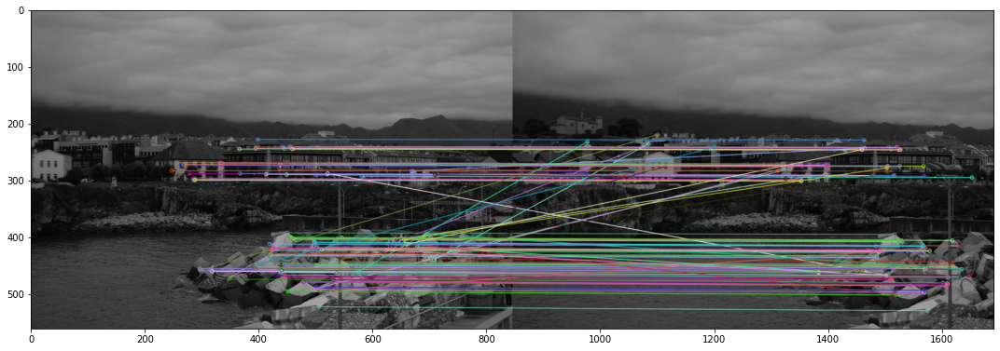

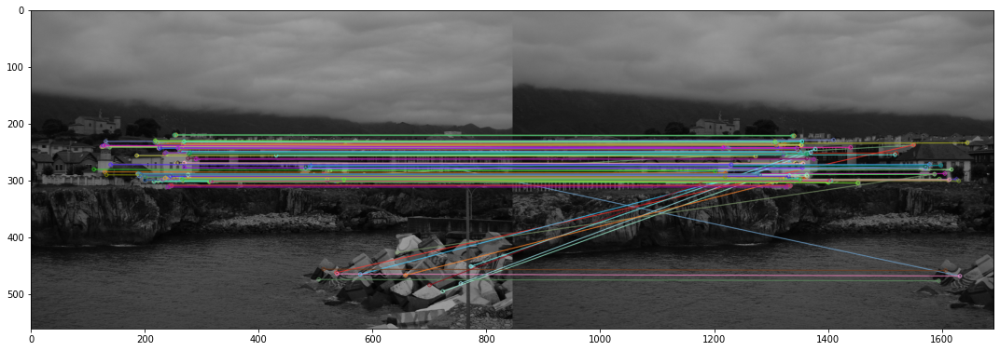

In [3]:
# Read images
img1 = cv2.imread('Data/llanes/llanes_a.jpg',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/llanes/llanes_b.jpg',cv2.IMREAD_GRAYSCALE)
img3 = cv2.imread('Data/llanes/llanes_c.jpg',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
kp3, des3 = orb.detectAndCompute(img3,None)

distance_thr = 0.85 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])

matches_23 = bf.knnMatch(des2,des3,k=2)
# Apply ratio test
good_matches_23 = []
for m,n in matches_23:
    if m.distance < distance_thr*n.distance:
        good_matches_23.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,good_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

### **1.2 Compute the homography (DLT algorithm) between image pairs**

The following cell of code calls the 'Ransac_DLT_homography' function from utils.py
Before running the code of the cell you first need to complete some functions in utils.py that are called from 'Ransac_DLT_homography' function:

<span style='color:Green'> - Complete the 'DLT_homography' function that computes a homography from a set of point correspondences with the DLT algorithm.  </span>

<span style='color:Green'> - Complete the 'Inliers' function that, given a homography, a set of point correspondences and a certain threshold  returns the indices of the correspondences that are inliers.  </span>


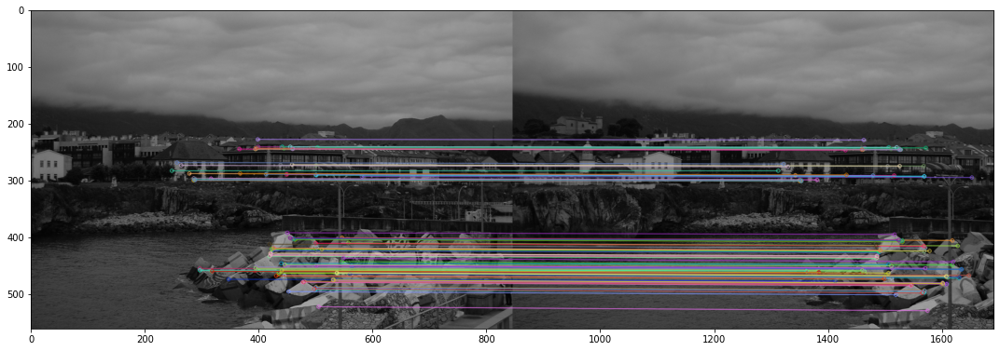

In [4]:
# Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

H_12, indices_inlier_matches_12 = Ransac_DLT_homography(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

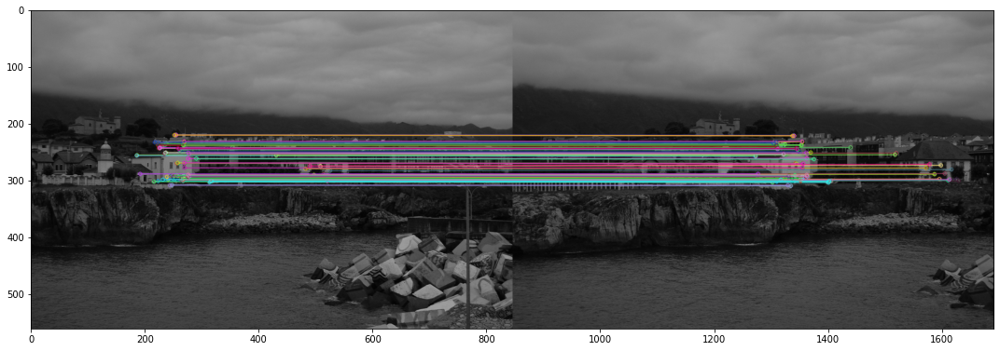

In [5]:
# Homography between images 2 and 3
points2 = []
points3 = []
for m in good_matches_23:
    points2.append([kp2[m[0].queryIdx].pt[0], kp2[m[0].queryIdx].pt[1], 1])
    points3.append([kp3[m[0].trainIdx].pt[0], kp3[m[0].trainIdx].pt[1], 1])
    
points2 = np.asarray(points2)
points2 = points2.T
points3 = np.asarray(points3)
points3 = points3.T

H_23, indices_inlier_matches_23 = Ransac_DLT_homography(points2, points3, 3, 1000)
inlier_matches_23 = itemgetter(*indices_inlier_matches_23)(good_matches_23)

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,inlier_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

## **2. Application: Image mosaics**

Now that the homographies relating the images have been estimated we can create a mosaic by properly transforming and fusing the different image contents.
For that we create a big enough canvas where the mosaic will be created. The function 'apply_H_fixed_image_size' is provided in utils.py, it is a variant of the 'apply_H' function from lab 1 where this time the size of the transformed is fixed and given as an extra input.

<span style='color:Green'> - Complete the 2nd input argument to the 'apply_H_fixed_image_size' function in order to get the image mosaic. </span>

True

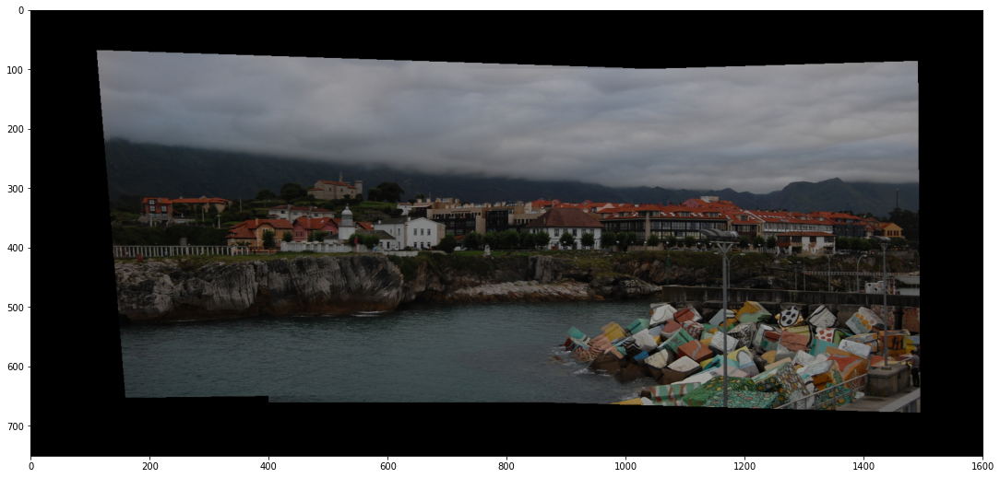

In [6]:
corners = [-400, 1200, -100, 650] # corners of the canvas where the mosaic will be created

#print(img1.shape)
img1c = cv2.imread('Data/llanes/llanes_a.jpg',cv2.IMREAD_COLOR)
img2c = cv2.imread('Data/llanes/llanes_b.jpg',cv2.IMREAD_COLOR)
img3c = cv2.imread('Data/llanes/llanes_c.jpg',cv2.IMREAD_COLOR)
img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

img1c_w = apply_H_fixed_image_size(img1c, H_12, corners) # complete the call to the function. img1 is the starting from the right
img2c_w = apply_H_fixed_image_size(img2c, np.eye(3), corners) # complete the call to the function. to append to img1
img3c_w = apply_H_fixed_image_size(img3c, np.linalg.inv(H_23), corners) # complete the call to the function. to append to img2

img_mosaic = np.maximum(img3c_w,np.maximum(img1c_w,img2c_w))
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_llanes.png', img_mosaic) 

<span style='color:Green'> - Compute the mosaic with castle_int images. </span>

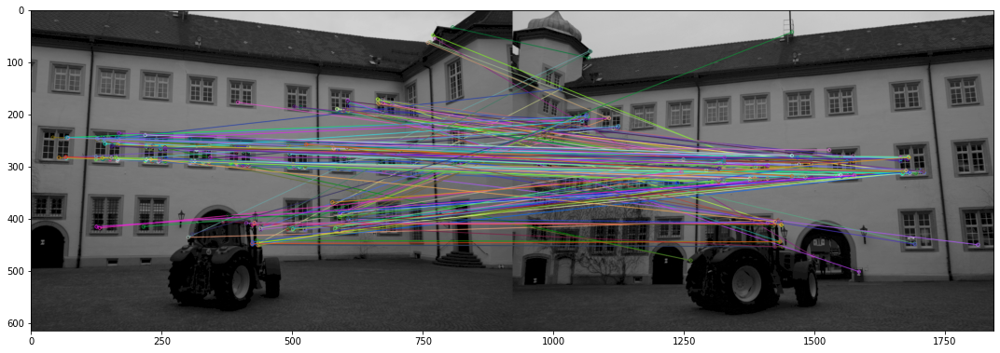

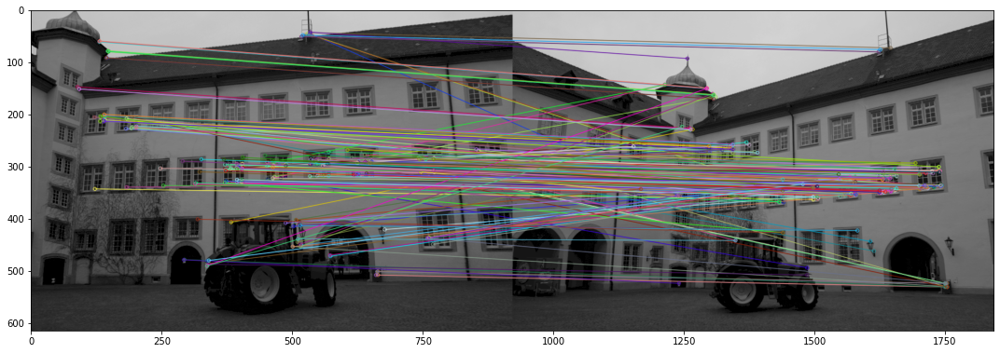

In [7]:
# Read images
img1 = cv2.imread('Data/castle_int/0014_s.png',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/castle_int/0015_s.png',cv2.IMREAD_GRAYSCALE)
img3 = cv2.imread('Data/castle_int/0016_s.png',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
kp3, des3 = orb.detectAndCompute(img3,None)

distance_thr = 0.95 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])

matches_23 = bf.knnMatch(des2,des3,k=2)
# Apply ratio test
good_matches_23 = []
for m,n in matches_23:
    if m.distance < distance_thr*n.distance:
        good_matches_23.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,good_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

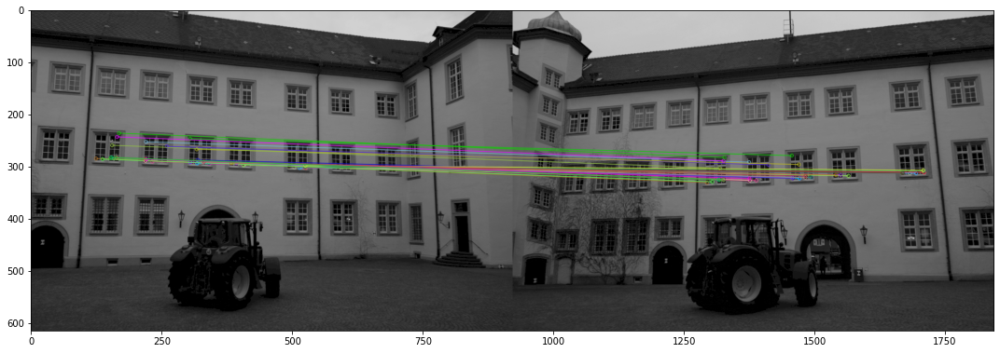

In [8]:
# Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

H_12, indices_inlier_matches_12 = Ransac_DLT_homography(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

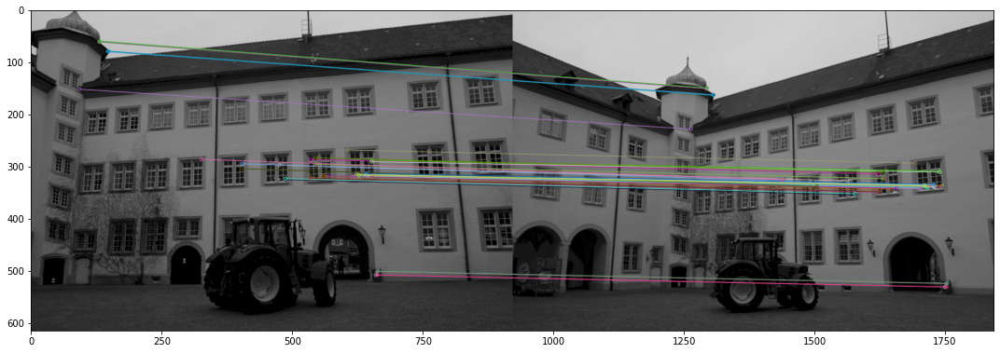

In [19]:
# Homography between images 2 and 3
points2 = []
points3 = []
for m in good_matches_23:
    points2.append([kp2[m[0].queryIdx].pt[0], kp2[m[0].queryIdx].pt[1], 1])
    points3.append([kp3[m[0].trainIdx].pt[0], kp3[m[0].trainIdx].pt[1], 1])
    
points2 = np.asarray(points2)
points2 = points2.T
points3 = np.asarray(points3)
points3 = points3.T

H_23, indices_inlier_matches_23 = Ransac_DLT_homography(points2, points3, 3, 1000)
inlier_matches_23 = itemgetter(*indices_inlier_matches_23)(good_matches_23)

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,inlier_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

True

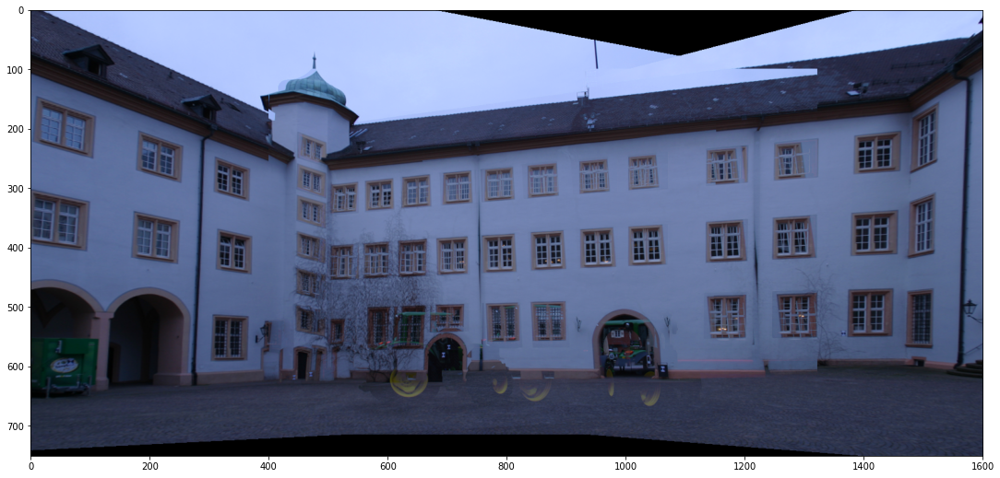

In [20]:
corners = [-400, 1200, -100, 650] # corners of the canvas where the mosaic will be created

#print(img1.shape)
img1c = cv2.imread('Data/castle_int/0014_s.png',cv2.IMREAD_COLOR)
img2c = cv2.imread('Data/castle_int/0015_s.png',cv2.IMREAD_COLOR)
img3c = cv2.imread('Data/castle_int/0016_s.png',cv2.IMREAD_COLOR)
img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

img1c_w = apply_H_fixed_image_size(img1c, H_12, corners) # complete the call to the function. img1 is the starting from the right
img2c_w = apply_H_fixed_image_size(img2c, np.eye(3), corners) # complete the call to the function. to append to img1
img3c_w = apply_H_fixed_image_size(img3c, np.linalg.inv(H_23), corners) # complete the call to the function. to append to img2

img_mosaic = np.maximum(img3c_w,np.maximum(img1c_w,img2c_w))
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_castle_int.png', img_mosaic) 

<span style='color:Green'> - Compute the mosaic with aerial images set 13 </span>

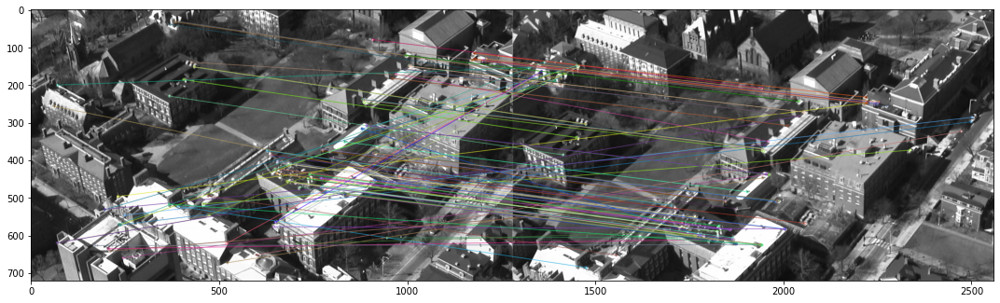

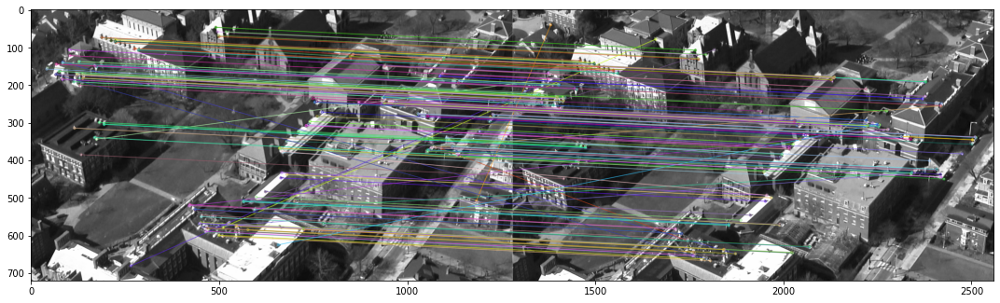

In [21]:
# Read images
img1 = cv2.imread('Data/aerial/site13/frame00000.png',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/aerial/site13/frame00002.png',cv2.IMREAD_GRAYSCALE)
img3 = cv2.imread('Data/aerial/site13/frame00003.png',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
kp3, des3 = orb.detectAndCompute(img3,None)

distance_thr = 0.85 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])

matches_23 = bf.knnMatch(des2,des3,k=2)
# Apply ratio test
good_matches_23 = []
for m,n in matches_23:
    if m.distance < distance_thr*n.distance:
        good_matches_23.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,good_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

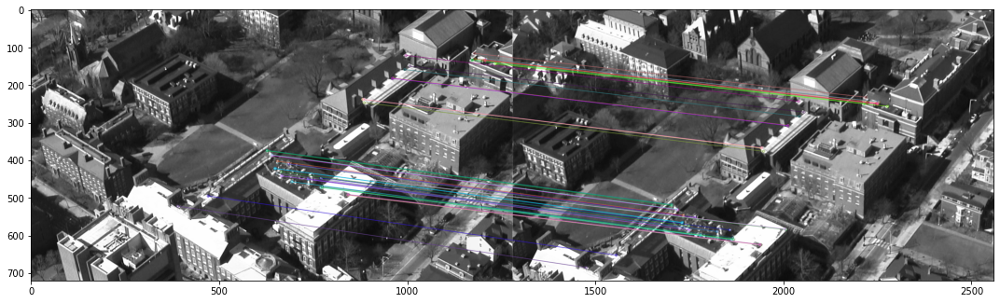

In [22]:
# Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

H_12, indices_inlier_matches_12 = Ransac_DLT_homography(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

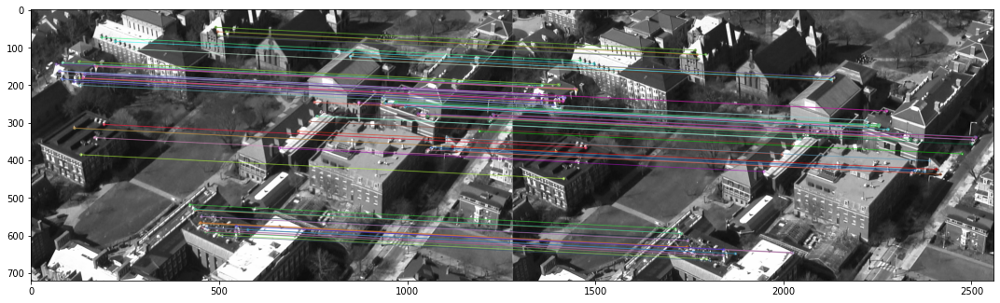

In [23]:
# Homography between images 2 and 3
points2 = []
points3 = []
for m in good_matches_23:
    points2.append([kp2[m[0].queryIdx].pt[0], kp2[m[0].queryIdx].pt[1], 1])
    points3.append([kp3[m[0].trainIdx].pt[0], kp3[m[0].trainIdx].pt[1], 1])
    
points2 = np.asarray(points2)
points2 = points2.T
points3 = np.asarray(points3)
points3 = points3.T

H_23, indices_inlier_matches_23 = Ransac_DLT_homography(points2, points3, 3, 1000)
inlier_matches_23 = itemgetter(*indices_inlier_matches_23)(good_matches_23)

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,inlier_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

(720, 1280, 3)


True

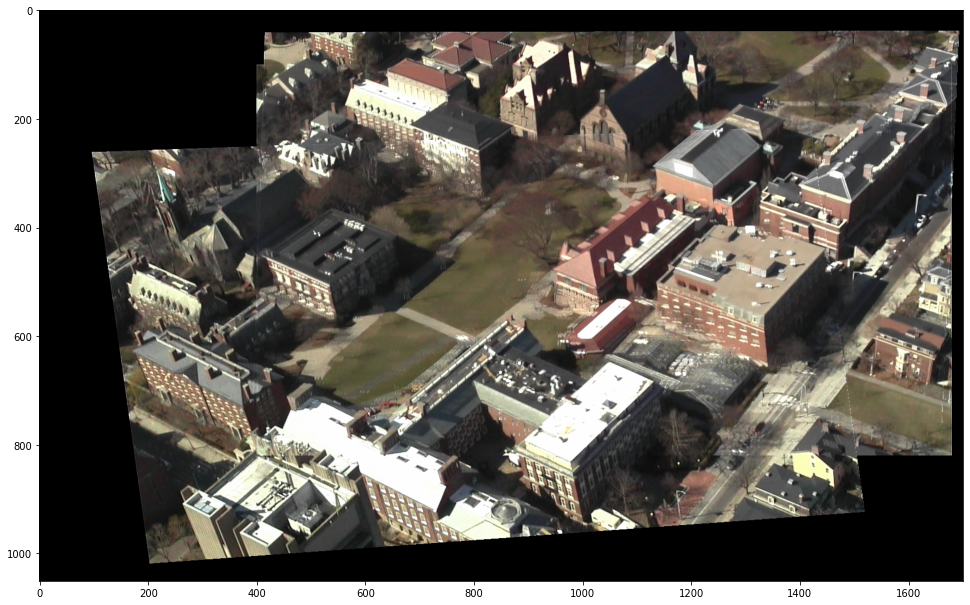

In [24]:
corners = [-400, 1300, -100, 950] # corners of the canvas where the mosaic will be created

#print(img1.shape)
img1c = cv2.imread('Data/aerial/site13/frame00000.png',cv2.IMREAD_COLOR)
print(img1c.shape)
img2c = cv2.imread('Data/aerial/site13/frame00002.png',cv2.IMREAD_COLOR)
img3c = cv2.imread('Data/aerial/site13/frame00003.png',cv2.IMREAD_COLOR)
img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

img1c_w = apply_H_fixed_image_size(img1c, H_12, corners) # complete the call to the function. img1 is the starting from the right
img2c_w = apply_H_fixed_image_size(img2c, np.eye(3), corners) # complete the call to the function. to append to img1
img3c_w = apply_H_fixed_image_size(img3c, np.linalg.inv(H_23), corners) # complete the call to the function. to append to img2

img_mosaic = np.maximum(img3c_w,np.maximum(img1c_w,img2c_w))
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_aerial_site13.png', img_mosaic) 

<span style='color:Green'> - Compute the mosaic with aerial images set 22 </span>

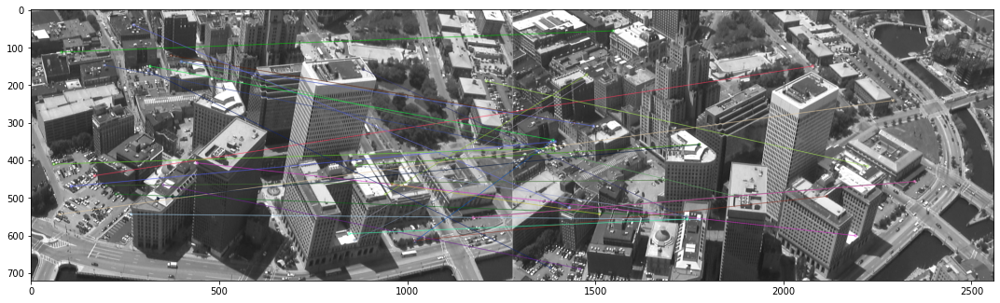

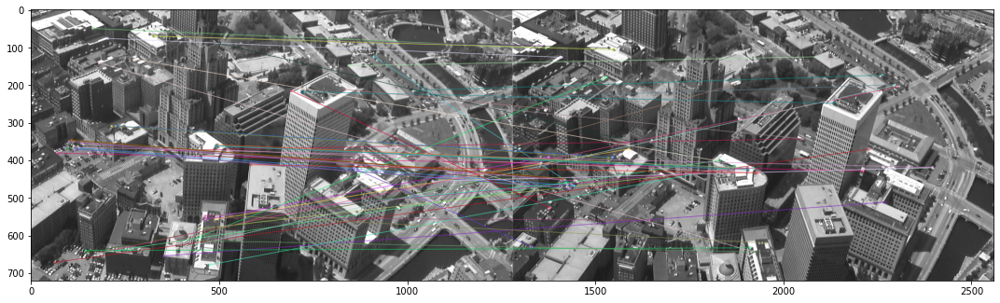

In [25]:
# Read images
img1 = cv2.imread('Data/aerial/site22/frame_00001.tif',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/aerial/site22/frame_00018.tif',cv2.IMREAD_GRAYSCALE)
img3 = cv2.imread('Data/aerial/site22/frame_00030.tif',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
kp3, des3 = orb.detectAndCompute(img3,None)

distance_thr = 0.85 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])

matches_23 = bf.knnMatch(des2,des3,k=2)
# Apply ratio test
good_matches_23 = []
for m,n in matches_23:
    if m.distance < distance_thr*n.distance:
        good_matches_23.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,good_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

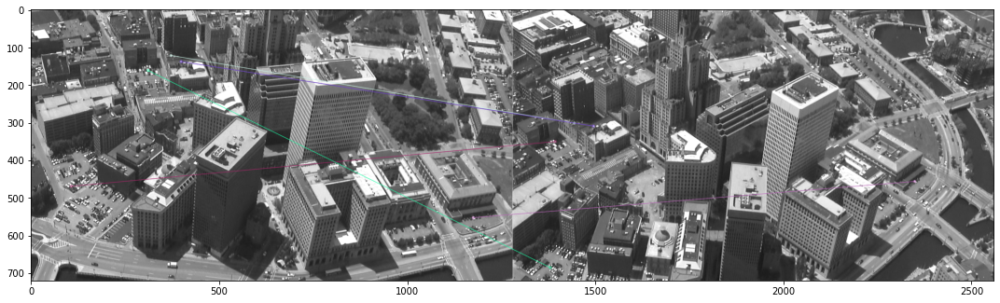

In [26]:
# Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

H_12, indices_inlier_matches_12 = Ransac_DLT_homography(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

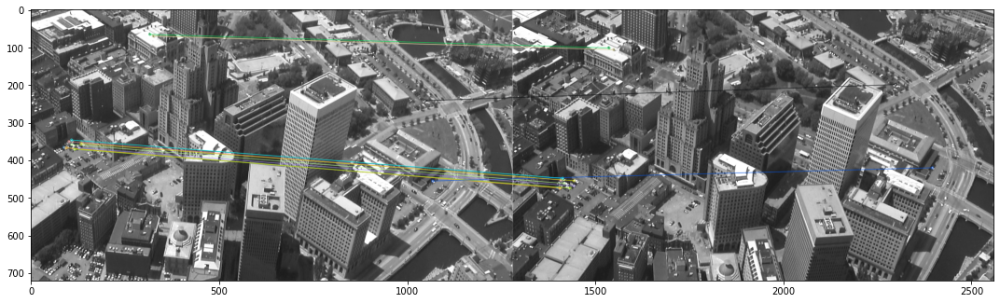

In [27]:
# Homography between images 2 and 3
points2 = []
points3 = []
for m in good_matches_23:
    points2.append([kp2[m[0].queryIdx].pt[0], kp2[m[0].queryIdx].pt[1], 1])
    points3.append([kp3[m[0].trainIdx].pt[0], kp3[m[0].trainIdx].pt[1], 1])
    
points2 = np.asarray(points2)
points2 = points2.T
points3 = np.asarray(points3)
points3 = points3.T

H_23, indices_inlier_matches_23 = Ransac_DLT_homography(points2, points3, 3, 1000)
inlier_matches_23 = itemgetter(*indices_inlier_matches_23)(good_matches_23)

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,inlier_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

True

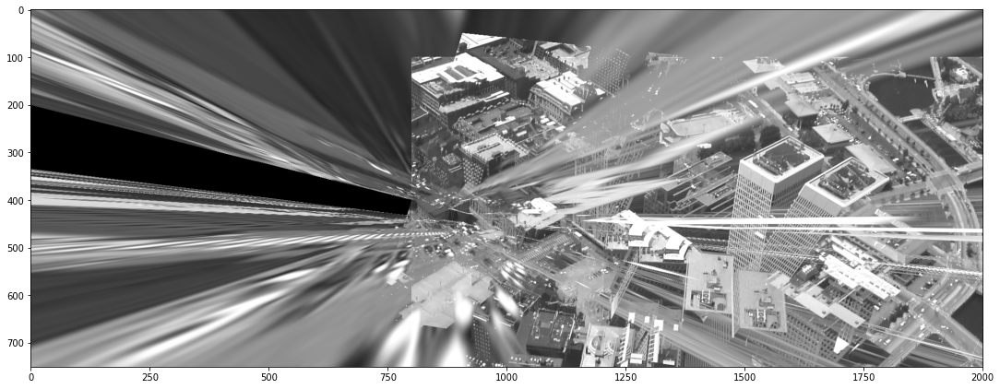

In [28]:
corners = [-800, 1200, -100, 650] # corners of the canvas where the mosaic will be created

#print(img1.shape)
img1c = cv2.imread('Data/aerial/site22/frame_00001.tif',cv2.IMREAD_COLOR)
img2c = cv2.imread('Data/aerial/site22/frame_00018.tif',cv2.IMREAD_COLOR)
img3c = cv2.imread('Data/aerial/site22/frame_00030.tif',cv2.IMREAD_COLOR)
img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

img1c_w = apply_H_fixed_image_size(img1c, H_12, corners) # complete the call to the function. img1 is the starting from the right
img2c_w = apply_H_fixed_image_size(img2c, np.eye(3), corners) # complete the call to the function. to append to img1
img3c_w = apply_H_fixed_image_size(img3c, np.linalg.inv(H_23), corners) # complete the call to the function. to append to img2

img_mosaic = np.maximum(img3c_w,np.maximum(img1c_w,img2c_w))
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_aerial_site22.png', img_mosaic) 

<span style='color:Green'> - In the report, comment the results in every of the four cases: hypothetise why it works or does not work </span>

## **3. Refinement of the estimated homography with the Gold Standard algorithm**

In order to refine the previous estimated homography we can minimize the geometric error with the Levenberg-Marquardt algorithm. For that we will call the function 'least_squares' with the proper input arguments that you have to complete. First, it is recommended to read the documentation of that function:

https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.least_squares.html

Notice that the first input is a function that only provides the vector of the residuals. The algorithm constructs the cost function as a sum of squares of the residuals. In our case the function is called 'geometric_error_terms' and you need to complete it.

More precisely, the tasks to perform are:

<span style='color:Green'> - Complete the function 'geometric_error_terms'. </span>

<span style='color:Green'> - Complete the code before calling function 'geometric_error_terms' in order to create the proper input of variables, 'variables0', to pass to the function. </span>

<span style='color:Green'> - Extract the refined homogaphy and the refined keypoint locations from the output, 'result', of function 'geometric_error_terms'.  </span>

<span style='color:Green'> - To better compare the two homographies (refined and non refined) compute and print the geometric error before and after the refinement. </span>

In [47]:
# # AQUESTA CEL·LA NO ÉS IMPORTANT, IGNORAR
# def gen_data(t, a, b, c, noise=0, n_outliers=0, random_state=0):
#     y = a + b * np.exp(t * c)

#     rnd = np.random.RandomState(random_state)
#     error = noise * rnd.randn(t.size)
#     outliers = rnd.randint(0, t.size, n_outliers)
#     error[outliers] *= 10

#     return y + error

# a = 0.5
# b = 2.0
# c = -1
# t_min = 0
# t_max = 10
# n_points = 15

# t_train = np.linspace(t_min, t_max, n_points)
# y_train = gen_data(t_train, a, b, c, noise=0.1, n_outliers=3)
# def fun(x, t, y):
#     return x[0] + x[1] * np.exp(x[2] * t) - y

# x0 = np.array([1.0, 1.0, 0.0])

# print(x0.shape)
# print(t_train.shape)
# print(y_train.shape)

(3,)
(15,)
(15,)


In [15]:
'''
import numpy as np
a = np.array([[1,2,3,4], [5,6,7,8], [9,10,11,12]])
b = np.array([[0.8,1.6,3.2,4.5], [4.8,6.2,7.1,7.6], [9.2,10.3,12.1,12.4]])

a = a/a[2,:]
b = b/b[2,:]

dab = np.linalg.norm(a-b)**2

# NO BORRAR
points1 = points1/points1[2,:]
points1_h = points1_h/points1_h[2,:]
d1 = np.linalg.norm(points1-points1_h)**2

points2 = points2/points2[2,:]
points2_h = points2_h/points2_h[2,:]
d2 = np.linalg.norm(points2-points2_h)**2

err = d1**2 + d2**2
'''

'\nimport numpy as np\na = np.array([[1,2,3,4], [5,6,7,8], [9,10,11,12]])\nb = np.array([[0.8,1.6,3.2,4.5], [4.8,6.2,7.1,7.6], [9.2,10.3,12.1,12.4]])\n\na = a/a[2,:]\nb = b/b[2,:]\n\ndab = np.linalg.norm(a-b)**2\n\n# NO BORRAR\npoints1 = points1/points1[2,:]\npoints1_h = points1_h/points1_h[2,:]\nd1 = np.linalg.norm(points1-points1_h)**2\n\npoints2 = points2/points2[2,:]\npoints2_h = points2_h/points2_h[2,:]\nd2 = np.linalg.norm(points2-points2_h)**2\n\nerr = d1**2 + d2**2\n'

In [68]:
from scipy.optimize import least_squares
from math import ceil


def geometric_error_terms(variables, data_points):

    # # NO BORRAR
    # points1 = points1/points1[2,:]
    # points1_h = points1_h/points1_h[2,:]
    # d1 = np.linalg.norm(points1-points1_h)**2
    
    # points2 = points2/points2[2,:]
    # points2_h = points2_h/points2_h[2,:]
    # d2 = np.linalg.norm(points2-points2_h)**2

    # err = d1**2 + d2**2

    print("AH")
    H = variables[:9]
    H = H.reshape(3,3)
    points1_h = variables[9:].reshape(3,-1)
    points1, points2 = data_points
    points1 = np.transpose(points1)
    points2 = np.transpose(points2)
    points1_h = np.transpose(points1_h) #points1_h = np.transpose(points1_h)
    err = 0
    print(points1_h.shape)
    print(points1.shape)
    print(points2.shape)
    for pidx,p1 in enumerate(points1):
        p2 = points2[pidx]
        p1h = points1_h[pidx]
        p2h = H @ p1h

        p1 = [p1[0]/p1[2], p1[1]/p1[2]] #[p1[0]/p1[2], p1[1]/p1[2]]
        p1h = [p1h[0]/p1h[2], p1h[1]/p1h[2]]
        p2 = [p2[0]/p2[2], p2[1]/p2[2]] #[p2[0]/p2[2], p2[1]/p2[2]]
        p2h = [p2h[0]/p2h[2], p2h[1]/p2h[2]]

        d1 = (p1[0]-p1h[0])**2+(p1[1]-p1h[1])**2
        d2 = (p2[0]-p2h[0])**2+(p2[1]-p2h[1])**2
        err += d1**2 + d2**2 #err += d1**2 + d2**2
        print(err)
    return err

# create array variables0 ....
# print(H_12.shape)
# print(points1[:,indices_inlier_matches_12].shape)
# H_12.tolist().extend(points1[:,indices_inlier_matches_12])
# print(np.array(H_12).shape)
# variables0 = np.array([H_12, ])


points2_inl = np.transpose(points2[:,indices_inlier_matches_12])
points1_h = np.empty(shape=points2_inl.shape)
for pidx, p2 in enumerate(points2_inl):
    points1_h[pidx] = np.linalg.inv(H_12) @ p2

H_12_array = H_12.flatten()
# points1_array = points1[:,indices_inlier_matches_12].flatten()
points1_array = points1_h.flatten()
variables0 = np.concatenate([H_12_array, points1_array])

# np.linalg.inv(H_12) @ np.points2[:,indices_inlier_matches_12]

#points = [points1[:,indices_inlier_matches_12], points2[:,indices_inlier_matches_12]]

print(H_12_array.shape)
print(points1_h.shape)
print(variables0.shape)

ptt1 = points1[:,indices_inlier_matches_12] #points1[:,indices_inlier_matches_12].flatten()
ptt2 = points2[:,indices_inlier_matches_12] #points2[:,indices_inlier_matches_12].flatten()
points = [ptt1, ptt2]
print(ptt1.shape)
print(ptt2.shape)

result = least_squares(geometric_error_terms, variables0, method='lm', 
                       args=([points]))
# result = least_squares(geometric_error_terms, variables0, method='lm', args=([points]))

# from result extract refined homogaphy and the refined keypoint locations ...

# H_ref,_ = result.x

# print initial and final square errors ...

# print(H_ref)

(9,)
(6, 3)
(27,)
(3, 6)
(3, 6)
AH
(6, 3)
(6, 3)
(6, 3)
2.2326225698686036e+16
2.2328497875819348e+16
2.2399087962977852e+16
2.2399849908001184e+16
2.2402759302983316e+16
2.240568091706658e+16


ValueError: Method 'lm' doesn't work when the number of residuals is less than the number of variables.

NameError: name 'points1r' is not defined

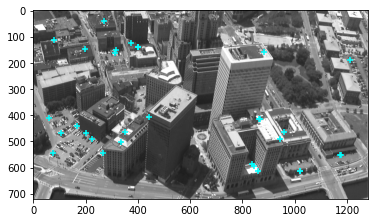

In [50]:
# display points and refined points
fig, ax = plt.subplots() # image 1
ax.imshow(img1c)
ax.scatter(points1[0,:],points1[1,:], c='cyan', marker='+')
ax.scatter(points1r[0,:],points1r[1,:], c='fuchsia', marker='+')
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

fig, ax = plt.subplots() # image 2
ax.imshow(img2c)Ç
ax.scatter(points2[0,:],points2[1,:], c='cyan', marker='+')
ax.scatter(points2r[0,:],points2r[1,:], c='fuchsia', marker='+')
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Green'> - Refine the homography 23 with the Gold Standard algorithm and visualize the differences in the keypoint locations. </span>

<span style='color:Green'> - Build mosaic with the refined homographies. </span>

## **4. OPTIONAL. Application: Calibration with a planar pattern and augmented reality**

As we have seen in class, we can calibrate a camera with a planar pattern with Zhang's algorithm. A key aspect of this algorithm is the estimation of a homography that relates a pair of images, in particular, the template image and an image of it taken with the camera we want to calibrate. Once the camera is calibrated and we have recovered the relative pose between the camera and the planar pattern we can properly insert a virtual object on top of the flat pattern in a way that it is consistent, in a perspective sense, with rest of the scene.

### **4.1 Camera calibration**

The following code calibrates a camera using N (where N greater or equal than three) views of the planar pattern. Most of the code is provided but there are parts you need to complete. These parts are indicated in green before the corresponding cell code.


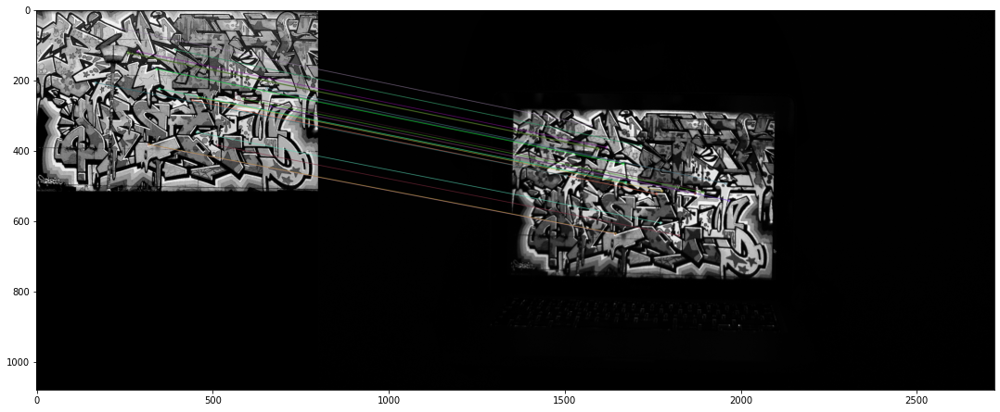

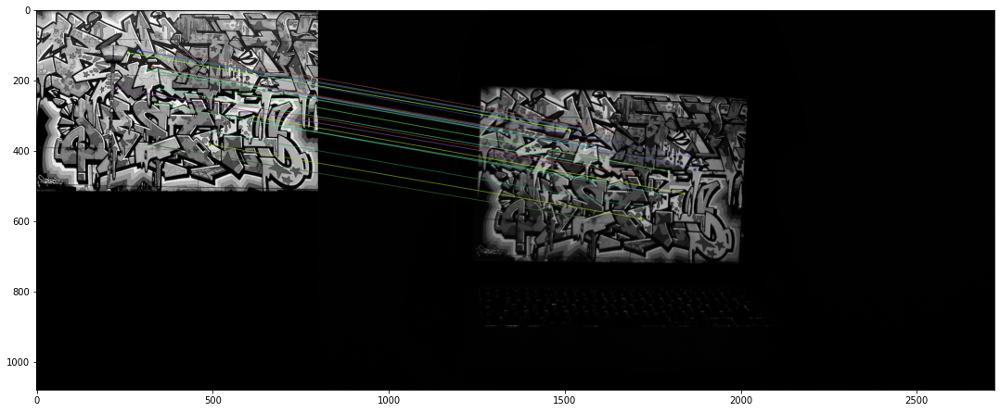

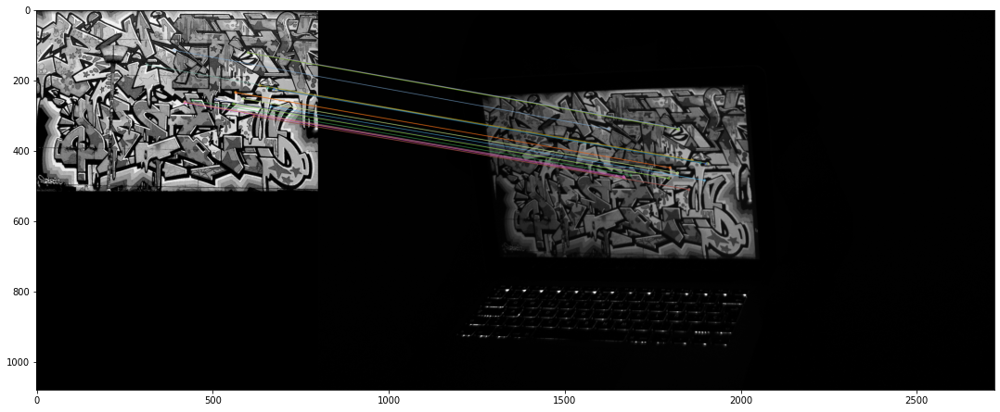

In [4]:
# Read template image and calibration images
template = cv2.imread('Data/calib/template.jpg',cv2.IMREAD_GRAYSCALE)
images = []
N = 3 # 3, 4, or 5
for i in range(1,N+1):
    m = cv2.imread("Data/calib/graffiti{0}.tif".format(i),cv2.IMREAD_GRAYSCALE)
    images.append(m)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kpt, dest = orb.detectAndCompute(template,None)
kpi, desi = [], []
for m in images:
    kp, des = orb.detectAndCompute(m,None)
    kpi.append(kp)
    desi.append(des)


# Keypoint matching and homography estimation
bf = cv2.BFMatcher()
H = []
for i in range(N):
    matches = bf.knnMatch(dest,desi[i],k=2)
    # Apply ratio test
    good_matches = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good_matches.append([m])
    
    # Fit homography and remove outliers
    points1 = []
    points2 = []
    for m in good_matches:
        points1.append([kpt[m[0].queryIdx].pt[0], kpt[m[0].queryIdx].pt[1], 1])
        points2.append([kpi[i][m[0].trainIdx].pt[0], kpi[i][m[0].trainIdx].pt[1], 1])
    
    points1 = np.asarray(points1)
    points1 = points1.T
    points2 = np.asarray(points2)
    points2 = points2.T
    
    Hi, indices_inlier_matches = Ransac_DLT_homography(points1, points2, 3, 1000)
    H.append(Hi)
    
    # Show inlier matches
    inlier_matches = itemgetter(*indices_inlier_matches)(good_matches)
    img_12 = cv2.drawMatchesKnn(template,kpt,images[i],kpi[i],inlier_matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(img_12)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()
    


<span style='color:Green'> - Complete the code that computes the Image of the Absolute Conic. </span>

In [5]:
# Compute the Image of the Absolute Conic ...

V = np.empty(shape=(2*N, 6))

def vij(hi,hj):
    return np.array([[hi[0]*hj[0], 
                     hi[0]*hj[1] + hi[1]*hj[0], 
                     hi[0]*hj[2] + hi[2]*hj[0], 
                     hi[1]*hj[1], 
                     hi[1]*hj[2] + hi[2]*hj[1],
                     hi[2]*hj[2]]])

for i in range(N):
    Hi = H[i]
    
    h1 = Hi[:,0]
    h2 = Hi[:,1]
    h3 = Hi[:,2]

    v12 = vij(h1,h2)
    v11 = vij(h1,h1)
    v22 = vij(h2,h2)

    V[2*i, :] = v12
    V[2*i+1, :] = (v11-v22)

U,D,UT = np.linalg.svd(V)
omega = UT[-1,:]
w = np.array([[omega[0], omega[1], omega[2]], 
              [omega[1], omega[3], omega[4]],
              [omega[2], omega[4], omega[5]]])
print(w)

[[ 1.24247685e-07  1.29426045e-09 -1.23542149e-04]
 [ 1.29426045e-09  1.24566683e-07 -9.94620894e-05]
 [-1.23542149e-04 -9.94620894e-05  9.99999987e-01]]


<span style='color:Green'> - Complete the code that computes the matrix of internal parameters, K. </span>

Note: there is a linalg.cholesky function both in numpy and scipy, you have to read the documentation of both and find out which is the proper one to use here.


In [10]:
import scipy
Kinv = scipy.linalg.cholesky(w)
K = np.linalg.inv(Kinv)
print(K)

[[ 2.83697721e+03 -2.95158930e+01  1.10265993e+03]
 [ 0.00000000e+00  2.83349567e+03  8.81378932e+02]
 [ 0.00000000e+00  0.00000000e+00  1.11819066e+00]]


<span style='color:Green'> - In the report, make some comments related to the obtained internal camera parameters and also comment their relation to the image size. </span>

<span style='color:Green'> - Complete the calculation of r1, r2, and ti in the code below. </span>

In [11]:
# Compute camera position and orientation
import math
R = []
t = []
P = []

for i in range(N):
    # compute r1, r2, and t{i}
    h = H[i]
    r1 = Kinv @ h[:,0]
    r2 = Kinv @ h[:,1]
    ti = Kinv @ h[:,2]
    
    # Solve the scale ambiguity by forcing r1 and r2 to be unit vectors.
    s = math.sqrt(np.linalg.norm(r1) * np.linalg.norm(r2)) * np.sign(ti[2])
    r1 = r1 / s
    r2 = r2 / s
    ti = ti / s
    t.append(ti)
    Ri = np.array([r1, r2, np.cross(r1,r2)])
    Ri = Ri.T
    
    # Ensure R is a rotation matrix
    U, d, Vt = np.linalg.svd(Ri)
    Ri = U @ np.identity(3) @ Vt
    R.append(Ri)
   
    # Pi = K * [Ri ti]
    A = np.zeros((3,4))
    A[:3,:3] = Ri
    A[:,3] = ti
    Pi = K @ A
    P.append(Pi)

The following code (no need to be completed) draws the planar pattern and the N camera locations (position and orientation).

<span style='color:Green'> - Take a look to the provided code for that and in the report explain how the optical center is computed. </span>

In [12]:
import plotly.graph_objects as go
from utils import plot_camera, plot_image_origin

ny, nx = images[0].shape

fig = go.Figure()
for i in range(N):
    plot_camera(P[i], nx, ny, fig, "camera{0}".format(i))

plot_image_origin(nx, ny, fig, "image")

fig.show()

Alternatively, we can draw a fixed camera and N planar patterns at different relative poses with respect to the camera.

<span style='color:Green'> -Complete the function ' plot_image_Rt' in order to achieve that. Note: it may be useful to look at function 'plot_image_origin' in utils.py</span>

In [13]:
def plot_image_Rt(R,t,w, h, fig, legend):
    Rt = np.column_stack([R, t])
    p1 = Rt @ np.array([0, 0, 0, 1])
    p2 = Rt @ np.array([w, 0, 0, 1])
    p3 = Rt @ np.array([w, h, 0, 1])
    p4 = Rt @ np.array([0, h, 0, 1])

    x = np.array([p1[0], p2[0], p3[0], p4[0], p1[0]])
    y = np.array([p1[1], p2[1], p3[1], p4[1], p1[1]])
    z = np.array([p1[2], p2[2], p3[2], p4[2], p1[2]])

    fig.add_trace(go.Scatter3d(x=x, y=z, z=-y, mode='lines',name=legend))
    
    return


fig = go.Figure()
A = np.zeros((3,4))
A[0,0]=A[1,1]=A[2,2]=1

plot_camera(K@A, nx, ny, fig, "camera")
for i in range(N):
    plot_image_Rt(R[i], t[i], nx, ny, fig, "image{0}".format(i))

fig.show()

### **4.2 Augmented reality**

The following code (no need to be completed) draws a simple 3D virtual object (a cube) on top of the flat pattern.

<span style='color:Green'> - Analyse the provided code and in the report explain how the virtual object is inserted in the image and why the camera view needs to be calibrated. </span>

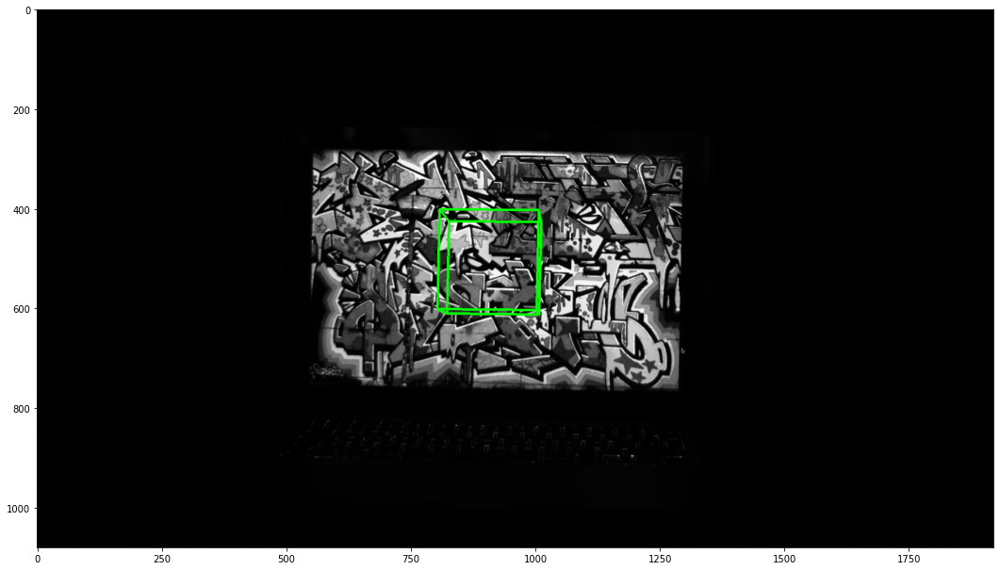

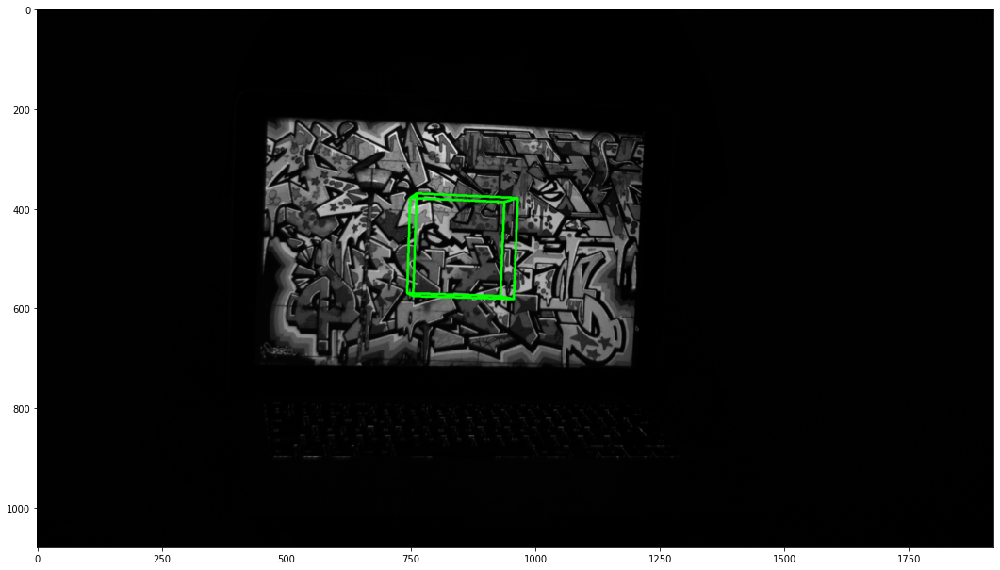

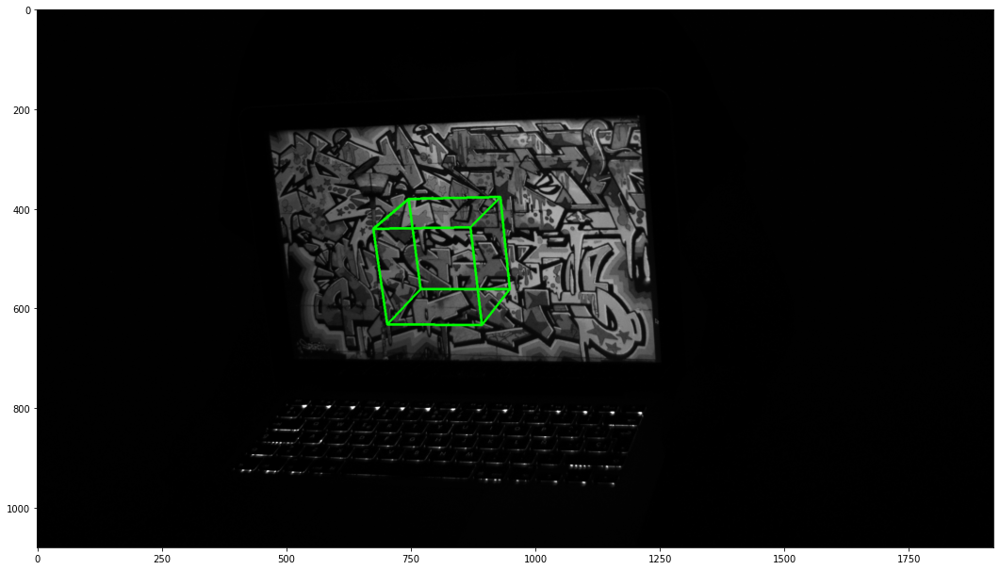

In [14]:
Th, Tw = template.shape
cube_corners = np.array([[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0], [0, 0, 0], [0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1], [0, 0, 1], [0, 0, 0], [1, 0, 0], [1, 0, 1], [0, 0, 1], [0, 0, 0], [0, 1, 0], [1, 1, 0], [1, 1, 1], [0, 1, 1], [0, 1, 0]])

import numpy.matlib
offset = np.array([Tw/2, Th/2, -Tw/8])
M = cube_corners.shape[0]
X = (cube_corners - 0.5) * Tw/ 4 + np.matlib.repmat(offset, M, 1)

X = X.T
ones = np.ones(M)
Xh = np.stack((X[0,:], X[1,:], X[2,:], ones), axis=0)

line_color = (0, 255, 0)

for i in range(N):
    
    xp = P[i]@Xh
    xp = xp / xp[2,:]
    xp = xp.astype(int)
    
    image = cv2.imread("Data/calib/graffiti{0}.tif".format(i+1),cv2.IMREAD_COLOR)
    image_gray = image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_gray[:, :, 0] = gray[:, :]
    image_gray[:, :, 1] = image_gray[:, :, 0]
    image_gray[:, :, 2] = image_gray[:, :, 0]
    for j in range(M-1):
        image = cv2.line(image_gray, (xp[0,j],xp[1,j]), (xp[0,j+1],xp[1,j+1]), line_color, 4) 
    plt.imshow(image)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()


## **5. OPTIONAL. Application: Logo detection**

<span style='color:Green'> - Detect the UPF logo in the two UPF images using the DLT algorithm (folder "logos").
Interpret and comment the results. </span>

#### 5a - Manually selecting the four corners in the target image (UPF building)

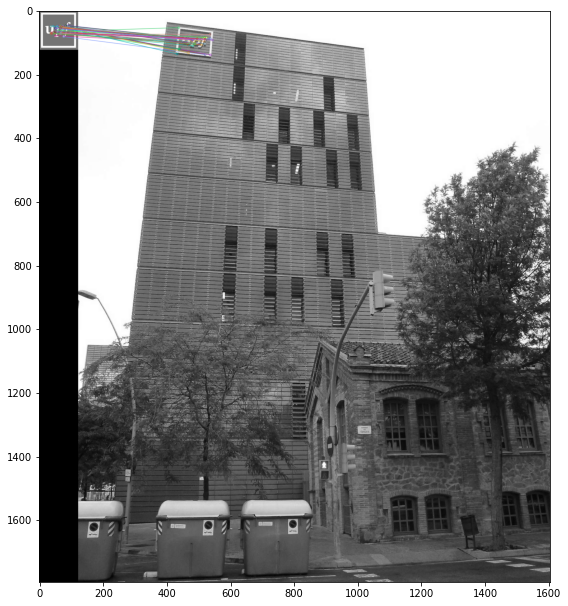

In [27]:
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_GRAYSCALE)

# Image UPFbuilding
upf_building = cv2.imread('Data/logos/UPFbuilding.jpg',cv2.IMREAD_GRAYSCALE)

# row, column
corners = np.array([[49, 315], 
                    [64, 424],
                    [129, 306],
                    [144, 417]])

x_max = int(np.max(corners[:,1]))
x_min = int(np.min(corners[:,1]))
y_max = int(np.max(corners[:,0]))
y_min = int(np.min(corners[:,0]))
w_out = x_max-x_min+1
h_out = y_max-y_min+1

building_mask = np.zeros(shape=upf_building.shape, dtype=np.uint8)
building_mask[y_min:y_max, x_min:x_max] = 255

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(upf_logo,None)
kp2, des2 = orb.detectAndCompute(upf_building, building_mask, None)

distance_thr = 0.95 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(upf_logo,kp1,upf_building,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()


In [28]:
# Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

H_12, indices_inlier_matches_12 = Ransac_DLT_homography(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

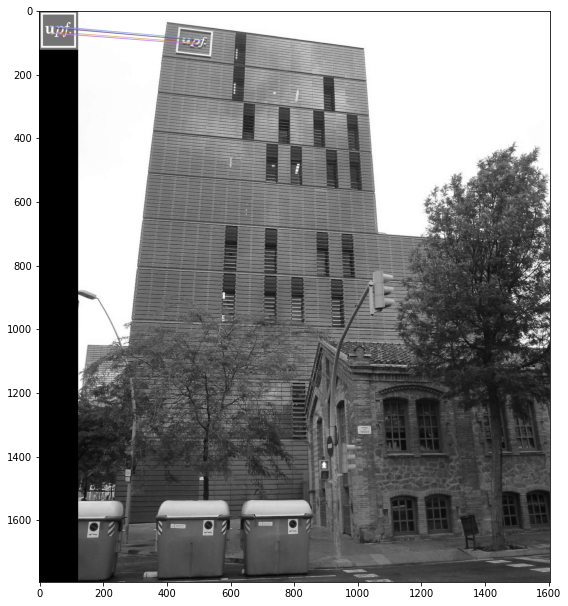

In [29]:
img_12 = cv2.drawMatchesKnn(upf_logo,kp1,upf_building,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

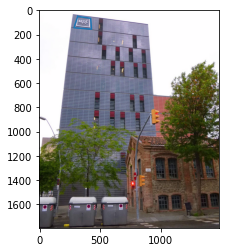

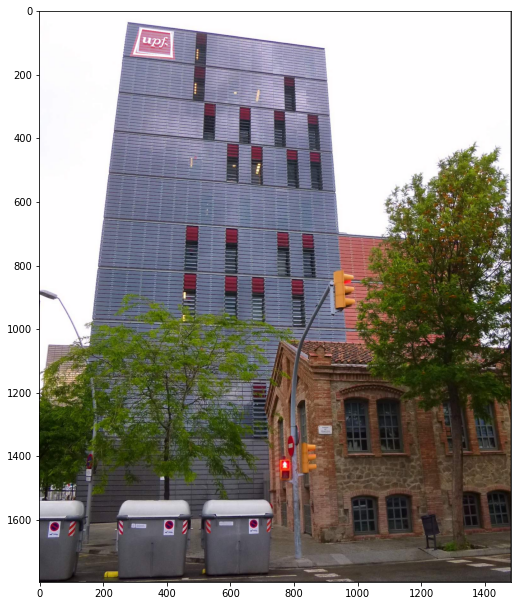

In [30]:
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_COLOR)
upf_logo = cv2.cvtColor(upf_logo, cv2.COLOR_BGR2RGB)
upf_building = cv2.imread('Data/logos/UPFbuilding.jpg',cv2.IMREAD_COLOR)
upf_building = cv2.cvtColor(upf_building, cv2.COLOR_BGR2RGB)

h,w,_ = upf_logo.shape
tl_logo = np.array([0,0,1])
tr_logo = np.array([w,0,1])
bl_logo = np.array([0,h,1])
br_logo = np.array([w,h,1])

tl_logo_h = H_12 @ tl_logo
tr_logo_h = H_12 @ tr_logo
bl_logo_h = H_12 @ bl_logo
br_logo_h = H_12 @ br_logo

tl_logo_h = tl_logo_h/tl_logo_h[2]
tr_logo_h = tr_logo_h/tr_logo_h[2]
bl_logo_h = bl_logo_h/bl_logo_h[2]
br_logo_h = br_logo_h/br_logo_h[2]

x_values = [tl_logo_h[0], tr_logo_h[0], br_logo_h[0], bl_logo_h[0], tl_logo_h[0]]
y_values = [tl_logo_h[1], tr_logo_h[1], br_logo_h[1], bl_logo_h[1], tl_logo_h[1]]
plot_img(upf_building)
plt.plot(x_values, y_values)

corners = [0, upf_building.shape[1], 0, upf_building.shape[0]] # corners of the canvas where the mosaic will be created

upf_logo_c_w = apply_H_fixed_image_size(upf_logo, H_12, corners) # complete the call to the function. img1 is the starting from the right
upf_stand_c_w = apply_H_fixed_image_size(upf_building, np.eye(3), corners) # complete the call to the function. to append to img1

img_mosaic = np.maximum(upf_logo_c_w,upf_stand_c_w)
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
#cv2.imwrite('mosaic_aerial_site22.png', img_mosaic) 

#### 5a - Manually selecting the four corners in the target image (UPF stand)

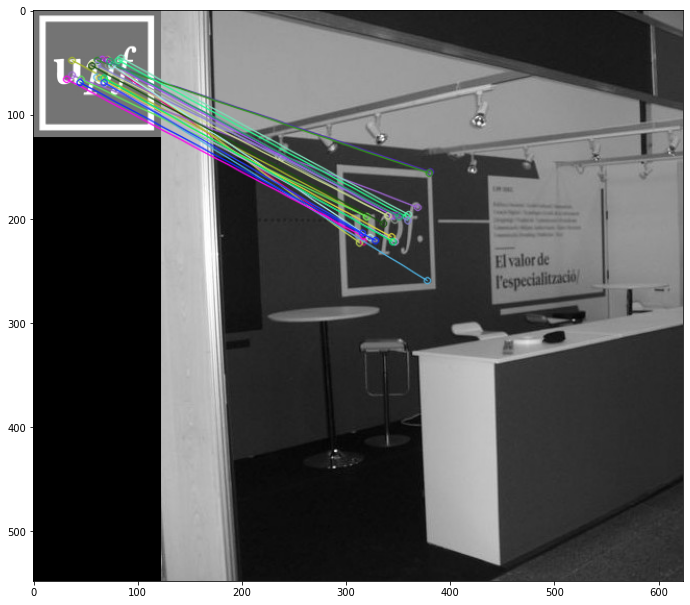

In [9]:
# Image UPFStand
upf_stand = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_GRAYSCALE)
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_GRAYSCALE)

# row, column
corners = np.array([[147, 168],
                    [154, 257],
                    [273, 173],
                    [267, 262]])

x_max = int(np.max(corners[:,1]))
x_min = int(np.min(corners[:,1]))
y_max = int(np.max(corners[:,0]))
y_min = int(np.min(corners[:,0]))
w_out = x_max-x_min+1
h_out = y_max-y_min+1

stand_mask = np.zeros(shape=upf_stand.shape, dtype=np.uint8)
stand_mask[y_min:y_max, x_min:x_max] = 255

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(upf_logo,None)
kp2, des2 = orb.detectAndCompute(upf_stand, stand_mask,None)

distance_thr = 0.85 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(upf_logo,kp1,upf_stand,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

In [11]:
#Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

H_12, indices_inlier_matches_12 = Ransac_DLT_homography(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

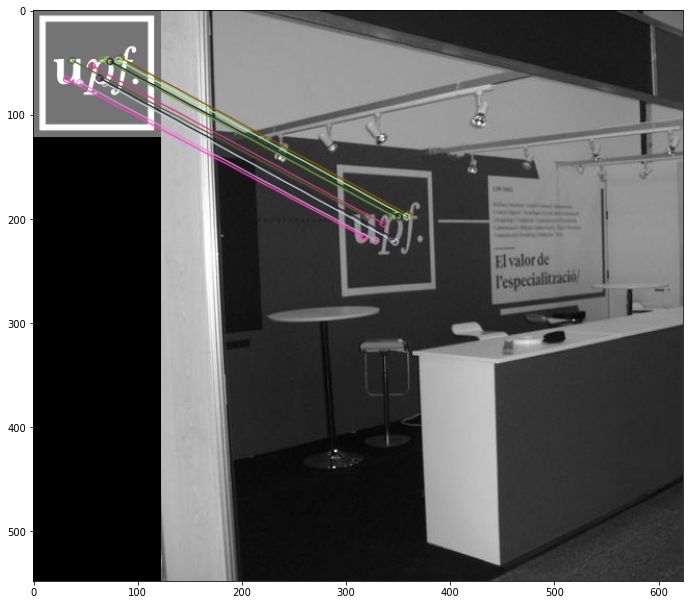

In [12]:
img_12 = cv2.drawMatchesKnn(upf_logo,kp1,upf_stand,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

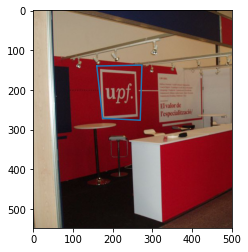

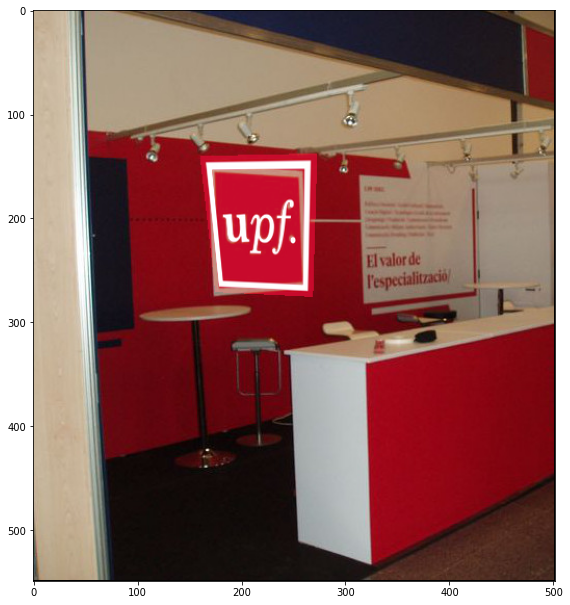

In [14]:
upf_stand = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_COLOR)
upf_stand = cv2.cvtColor(upf_stand, cv2.COLOR_BGR2RGB)
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_COLOR)
upf_logo = cv2.cvtColor(upf_logo, cv2.COLOR_BGR2RGB)

h,w,_ = upf_logo.shape
tl_logo = np.array([0,0,1])
tr_logo = np.array([w,0,1])
bl_logo = np.array([0,h,1])
br_logo = np.array([w,h,1])

tl_logo_h = H_12 @ tl_logo
tr_logo_h = H_12 @ tr_logo
bl_logo_h = H_12 @ bl_logo
br_logo_h = H_12 @ br_logo

tl_logo_h = tl_logo_h/tl_logo_h[2]
tr_logo_h = tr_logo_h/tr_logo_h[2]
bl_logo_h = bl_logo_h/bl_logo_h[2]
br_logo_h = br_logo_h/br_logo_h[2]

x_values = [tl_logo_h[0], tr_logo_h[0], br_logo_h[0], bl_logo_h[0], tl_logo_h[0]]
y_values = [tl_logo_h[1], tr_logo_h[1], br_logo_h[1], bl_logo_h[1], tl_logo_h[1]]
plot_img(upf_stand)
plt.plot(x_values, y_values)

corners = [0, upf_stand.shape[1], 0, upf_stand.shape[0]] # corners of the canvas where the mosaic will be created

upf_logo_c_w = apply_H_fixed_image_size(upf_logo, H_12, corners) # complete the call to the function. img1 is the starting from the right
upf_stand_c_w = apply_H_fixed_image_size(upf_stand, np.eye(3), corners) # complete the call to the function. to append to img1

img_mosaic = np.maximum(upf_logo_c_w,upf_stand_c_w)
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
#cv2.imwrite('mosaic_aerial_site22.png', img_mosaic) 

#### 5b - Automatically selecting the four corners in the target image (UPF building)

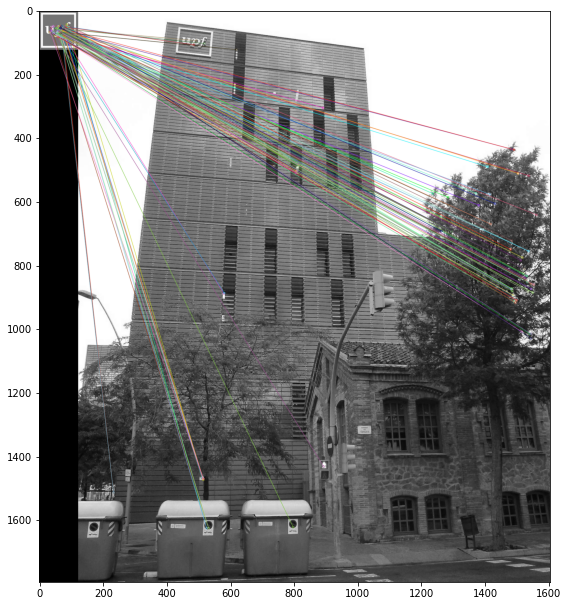

In [15]:
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_GRAYSCALE)
upf_building = cv2.imread('Data/logos/UPFbuilding.jpg',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(upf_logo,None)
kp2, des2 = orb.detectAndCompute(upf_building,None)

distance_thr = 0.99 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(upf_logo,kp1,upf_building,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

############ PROBLEM!!!!!!!
# WE CANNOT DETECT THE UPF LOGO AUTOMATICALLY IN THE BUILDING IMAGE BECAUSE THERE ARE NO KEYPOINT MATCHES!!
# TRY IT WITH SIFT OR SURF!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

#### 5b - Automatically selecting the four corners in the target image (UPF stand)

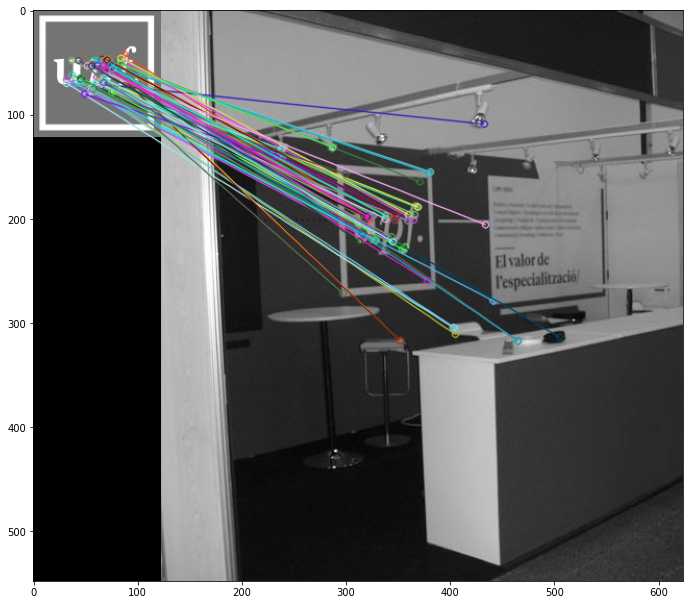

In [16]:
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_GRAYSCALE)
upf_stand = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(upf_logo,None)
kp2, des2 = orb.detectAndCompute(upf_stand,None)

distance_thr = 0.95 #original 0.85 millor 0.75

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < distance_thr*n.distance:
        good_matches_12.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(upf_logo,kp1,upf_stand,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

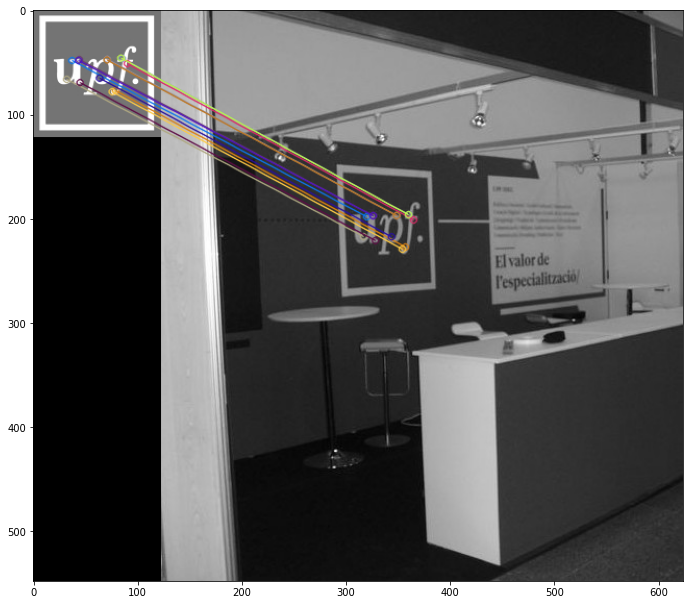

In [17]:
# Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

H_12, indices_inlier_matches_12 = Ransac_DLT_homography(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

img_12 = cv2.drawMatchesKnn(upf_logo,kp1,upf_stand,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

In [18]:
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_GRAYSCALE)
h,w = upf_logo.shape
tl_logo = np.array([0,0,1])
tr_logo = np.array([w,0,1])
bl_logo = np.array([0,h,1])
br_logo = np.array([w,h,1])

tl_logo_h = H_12 @ tl_logo
tr_logo_h = H_12 @ tr_logo
bl_logo_h = H_12 @ bl_logo
br_logo_h = H_12 @ br_logo

tl_logo_h = tl_logo_h/tl_logo_h[2]
tr_logo_h = tr_logo_h/tr_logo_h[2]
bl_logo_h = bl_logo_h/bl_logo_h[2]
br_logo_h = br_logo_h/br_logo_h[2]

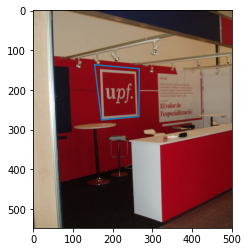

In [19]:
upf_stand_c = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_COLOR)
upf_stand_c = cv2.cvtColor(upf_stand_c, cv2.COLOR_BGR2RGB)
x_values = [tl_logo_h[0], tr_logo_h[0], br_logo_h[0], bl_logo_h[0], tl_logo_h[0]]
y_values = [tl_logo_h[1], tr_logo_h[1], br_logo_h[1], bl_logo_h[1], tl_logo_h[1]]
plot_img(upf_stand_c)
plt.plot(x_values, y_values)

True

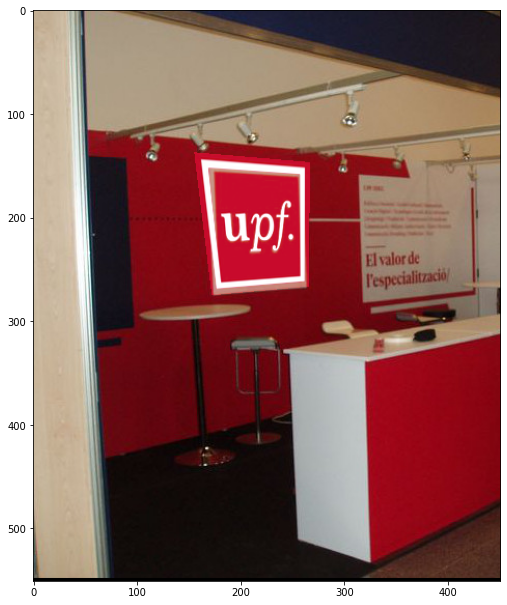

In [20]:
corners = [0, 450, 0, 550] # corners of the canvas where the mosaic will be created

upf_logo_c = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_COLOR)
upf_stand_c = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_COLOR)
upf_logo_c = cv2.cvtColor(upf_logo_c, cv2.COLOR_BGR2RGB)
upf_stand_c = cv2.cvtColor(upf_stand_c, cv2.COLOR_BGR2RGB)

upf_logo_c_w = apply_H_fixed_image_size(upf_logo_c, H_12, corners) # complete the call to the function. img1 is the starting from the right
upf_stand_c_w = apply_H_fixed_image_size(upf_stand_c, np.eye(3), corners) # complete the call to the function. to append to img1

img_mosaic = np.maximum(upf_logo_c_w,upf_stand_c_w)
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_aerial_site22.png', img_mosaic) 

## **6. OPTIONAL. Application: Logo replacement**

<span style='color:Green'> - Replace the UPF logo by the master logo in one of the previous images using the DLT algorithm. </span>


True

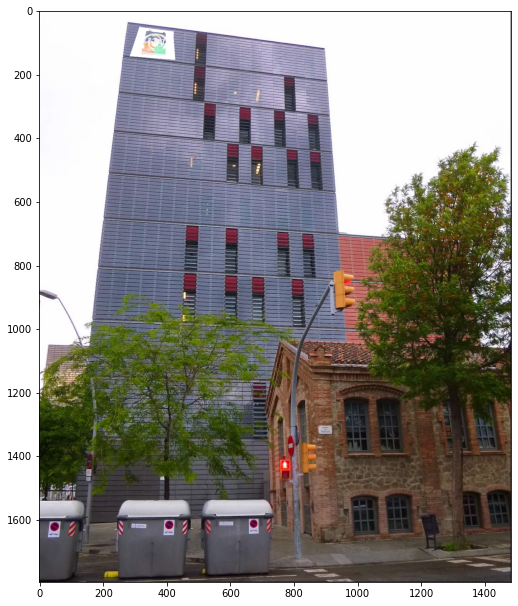

In [31]:
corners = [0, upf_building.shape[1], 0, upf_building.shape[0]] # corners of the canvas where the mosaic will be created

mcv_logo_c = cv2.imread('Data/logos/logo_master.png',cv2.IMREAD_COLOR)
mcv_logo_c = cv2.resize(mcv_logo_c, (upf_logo.shape[1],upf_logo.shape[0]))
mcv_logo_c = cv2.cvtColor(mcv_logo_c, cv2.COLOR_BGR2RGB)

upf_building_c = cv2.imread('Data/logos/UPFbuilding.jpg',cv2.IMREAD_COLOR)
upf_building_c = cv2.cvtColor(upf_building_c, cv2.COLOR_BGR2RGB)

mcv_logo_c_w = apply_H_fixed_image_size(mcv_logo_c, H_12, corners) # complete the call to the function. img1 is the starting from the right
upf_building_c_w = apply_H_fixed_image_size(upf_building_c, np.eye(3), corners) # complete the call to the function. to append to img1

img_mosaic = np.maximum(mcv_logo_c_w,upf_building_c_w)
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_aerial_site22.png', img_mosaic) 

True

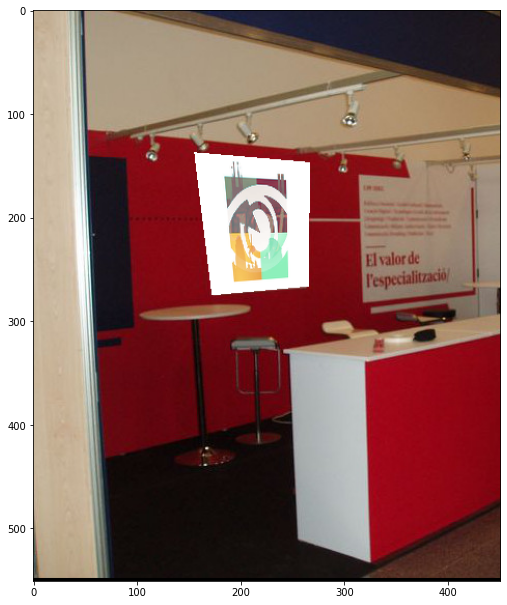

In [21]:
corners = [0, 450, 0, 550] # corners of the canvas where the mosaic will be created

mcv_logo_c = cv2.imread('Data/logos/logo_master.png',cv2.IMREAD_COLOR)
mcv_logo_c = cv2.resize(mcv_logo_c, (upf_logo.shape[1],upf_logo.shape[0]))
mcv_logo_c = cv2.cvtColor(mcv_logo_c, cv2.COLOR_BGR2RGB)

upf_stand_c = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_COLOR)
upf_stand_c = cv2.cvtColor(upf_stand_c, cv2.COLOR_BGR2RGB)

mcv_logo_c_w = apply_H_fixed_image_size(mcv_logo_c, H_12, corners) # complete the call to the function. img1 is the starting from the right
upf_stand_c_w = apply_H_fixed_image_size(upf_stand_c, np.eye(3), corners) # complete the call to the function. to append to img1

img_mosaic = np.maximum(mcv_logo_c_w,upf_stand_c_w)
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_aerial_site22.png', img_mosaic) 